In [8]:
from keras.models import load_model

# Load the saved model
model = load_model('F:/Paraqum/New Models/Dataset/Day 2 and 3 Combined Sampled/best_densenet121_model_c2.keras')

In [9]:
import tensorflow as tf

# Check if TensorFlow can access GPUs
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"Available GPUs: {gpus}")
else:
    print("No GPUs found. The model will run on the CPU.")


No GPUs found. The model will run on the CPU.


In [10]:
from keras.utils import image_dataset_from_directory

# Load validation data
val_dir = 'F:/Paraqum/New Models/Dataset/Day 2/Val'
IMG_HEIGHT = 512
IMG_WIDTH = 512
BATCH_SIZE = 32

val_dataset = image_dataset_from_directory(
    val_dir,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode='categorical'  # Use 'int' for sparse labels
)

# Optional: Normalize data
normalization_layer = tf.keras.layers.Rescaling(1./255)
val_dataset = val_dataset.map(lambda x, y: (normalization_layer(x), y))


Found 1800 files belonging to 3 classes.


In [11]:
loss, accuracy = model.evaluate(val_dataset)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")


57/57 ━━━━━━━━━━━━━━━━━━━━ 417s 7s/step - accuracy: 0.9288 - loss: 0.1541
Validation Loss: 0.1409756988286972
Validation Accuracy: 0.9377777576446533


Found 1800 images belonging to 3 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


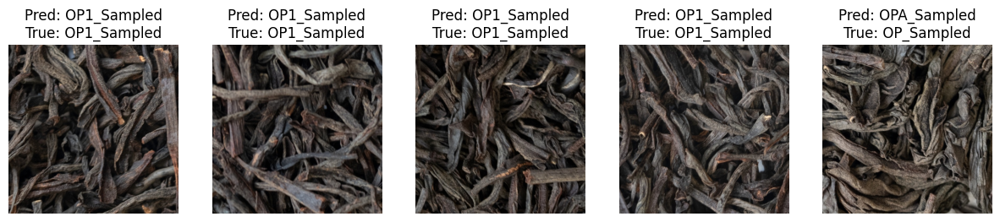

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths to dataset (update with the actual paths on your local machine)
val_dir = 'Dataset\Day 2\Val'

# Parameters
IMG_HEIGHT = 512
IMG_WIDTH = 512
BATCH_SIZE = 32

# Image data generator
val_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Get a batch of images and their corresponding labels
images, labels = next(iter(val_generator))

# Predict the classes of these images
predictions = model.predict(images)

# Get predicted class indices
predicted_class_indices = np.argmax(predictions, axis=1)

# Map predicted indices to class labels
class_labels = list(val_generator.class_indices.keys())  # Get class labels from the generator
predicted_labels = [class_labels[i] for i in predicted_class_indices]
true_labels = [class_labels[i] for i in np.argmax(labels, axis=1)]  # Convert true labels to class labels

# Plot a few images with their predictions
num_images = 5  # Number of images to display
plt.figure(figsize=(15, 15))
for i in range(num_images):
    ax = plt.subplot(1, num_images, i + 1)
    plt.imshow(images[i])
    plt.title(f"Pred: {predicted_labels[i]}\nTrue: {true_labels[i]}")
    plt.axis('off')
plt.show()


## DINO

In [59]:
import torch
import timm
import torch.nn as nn

# Define the number of classes in your problem
num_classes = 10  # Example, replace with your actual number of classes

# Load the pre-trained model
model = timm.create_model('vit_base_patch16_224_dino', pretrained=True)

# Disable training for all layers (treat it as feature extraction)
for param in model.parameters():
    param.requires_grad = False  # Freeze all layers

# Replace the classification head for the correct number of classes (optional, if you want to modify it)
model.head = nn.Linear(model.embed_dim, num_classes)

# Load the checkpoint
checkpoint = torch.load('Dataset/Day 2 and 3 Combined Sampled/best_model.pth', weights_only=True)

# Remove 'module.' prefix from the state_dict keys
checkpoint = {k.replace('module.', ''): v for k, v in checkpoint.items()}

# Remove the 'head' keys (classification layer weights) from the checkpoint
checkpoint = {k: v for k, v in checkpoint.items() if 'head' not in k}

# Load the modified state_dict into the model
model.load_state_dict(checkpoint, strict=False)

# Ensure the model is in evaluation mode (for feature extraction)
model.eval()




c:\Python311\Lib\site-packages\timm\models\_factory.py:117: UserWarning: Mapping deprecated model name vit_base_patch16_224_dino to current vit_base_patch16_224.dino.
  model = create_fn(


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity(

In [60]:
import timm
import torch
import torch.nn as nn
from torch.optim import Adam
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import os
from torchvision import datasets, transforms, models

In [63]:
# Parameters
img_height = 224
img_width = 224
batch_size = 32

# Define the transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

# Base directory
data_dir = 'Dataset/Day 2 and 3 Combined Sampled/Train'





val_dataset = datasets.ImageFolder(root=data_dir, transform=val_transforms)

# Create DataLoaders for training and validation datasets

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)



num_classes = len(val_dataset.class_to_idx)
print("Number of classes:", num_classes)

Number of classes: 3


In [64]:
def extract_features(model, dataloader, device):
    features_list = []
    labels_list = []
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            features = model(images)  # Forward pass, features from the penultimate layer
            features_list.append(features.cpu())  # Move to CPU for storing
            labels_list.append(labels.cpu())
    features = torch.cat(features_list, dim=0)
    labels = torch.cat(labels_list, dim=0)
    return features, labels


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Extract features
features, labels = extract_features(model, val_loader, device)

# Now `features` contains the feature vectors (before classification layer)

In [65]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Convert features and labels to numpy arrays
features_np = features.cpu().numpy()  # Convert to NumPy array
labels_np = labels.cpu().numpy()  # Convert to NumPy array

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(features_np, labels_np)

# Predict on the same data (or use a separate test set)
predictions = clf.predict(features_np)

# Calculate accuracy (if you have a test set, use test_loader instead)
accuracy = accuracy_score(labels_np, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 99.98%


In [76]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.manifold import TSNE

# Convert features and labels to numpy arrays
features_np = features.cpu().numpy()  # Convert to NumPy array
labels_np = labels.cpu().numpy()  # Convert to NumPy array

# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=3, random_state=42)  # Reduce to 3 components for RandomForest
features_tsne = tsne.fit_transform(features_np)

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(features_tsne, labels_np)

# Predict on the same data (or use a separate test set)
predictions = clf.predict(features_tsne)

# Calculate accuracy (if you have a test set, use test_loader instead)
accuracy = accuracy_score(labels_np, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 99.98%


In [66]:
# Parameters
img_height = 224
img_width = 224
batch_size = 32

# Define the transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

# Base directory
data_dir = 'Dataset/Day 2 and 3 Combined Sampled/Val'


val_dataset = datasets.ImageFolder(root=data_dir, transform=val_transforms)

# Create DataLoaders for training and validation datasets

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)



num_classes = len(val_dataset.class_to_idx)
print("Number of classes:", num_classes)

Number of classes: 3


In [68]:

# Extract features
features_val, labels_val = extract_features(model, val_loader, device)

# Now `features` contains the feature vectors (before classification layer)

TSNE dimension reduced

In [78]:
# Convert features and labels to numpy arrays
features_val_np = features_val.cpu().numpy()  # Convert to NumPy array
labels_val_np = labels_val.cpu().numpy()  # Convert to NumPy array

# Reduce dimensionality using t-SNE
tsneV = TSNE(n_components=3, random_state=42)  # Reduce to 3 components for RandomForest
features_tsneV = tsne.fit_transform(features_val_np)

# Predict on the same data (or use a separate test set)
predictions = clf.predict(features_tsneV)

# Calculate accuracy (if you have a test set, use test_loader instead)
accuracy = accuracy_score(labels_val_np, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 77.27%


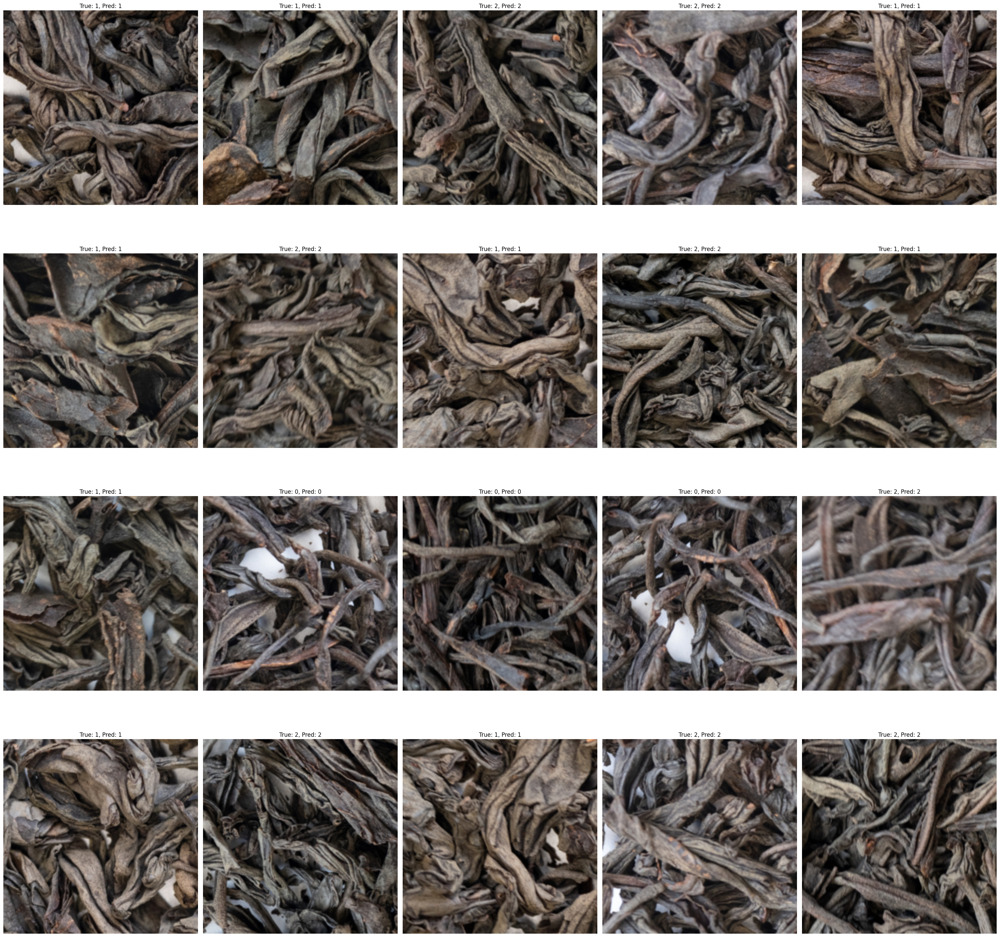

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Predict on the validation set
predictions = clf.predict(features_val_np)

# Number of images to show
num_images_to_show = 20
num_columns = 5  # Set the number of columns
num_rows = num_images_to_show // num_columns  # Calculate the number of rows needed

# Create the subplots grid
fig, axes = plt.subplots(num_rows, num_columns, figsize=(30, 30))

# Generate random indices for images to show
random_indices = np.random.choice(len(val_loader.dataset), num_images_to_show, replace=False)

# Loop through random images in the validation set
for i, idx in enumerate(random_indices):
    row = i // num_columns  # Calculate the row index
    col = i % num_columns  # Calculate the column index

    # Get the image and its true label
    img = val_loader.dataset[idx][0].cpu().numpy().transpose(1, 2, 0)  # Get image from the dataset and convert to HxWxC format
    true_label = labels_val_np[idx]
    predicted_val_label = predictions[idx]

    # Plot the image
    ax = axes[row, col]
    ax.imshow(img)
    ax.set_title(f"True: {true_label}, Pred: {predicted_val_label}")
    ax.axis('off')  # Turn off axis

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


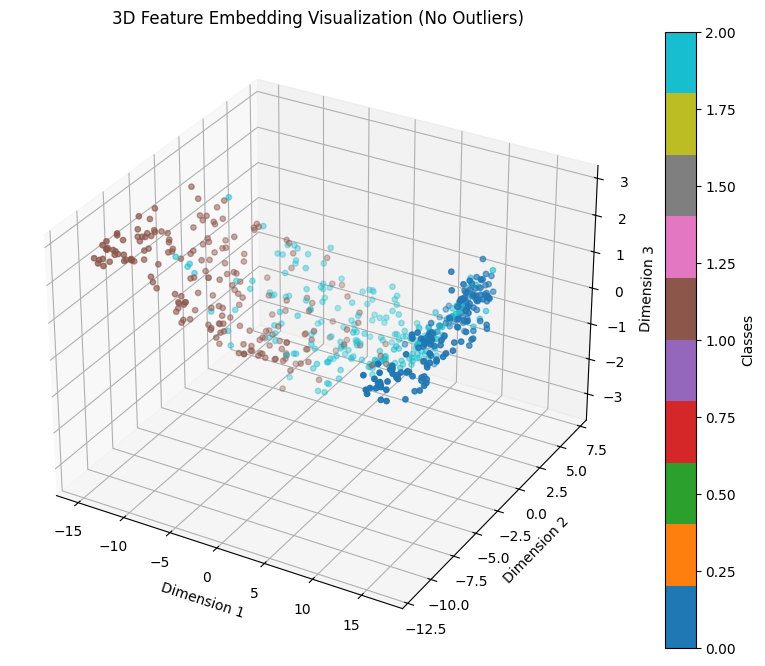

In [70]:
import numpy as np
import torch
from sklearn.manifold import TSNE
from scipy.stats import zscore
import matplotlib.pyplot as plt

# Function to visualize 3D feature embeddings after removing outliers with random samples
def visualize_embeddings_3d_no_outliers(model, dataloader, num_samples=600, z_threshold=3):
    model.eval()
    features, labels = [], []

    # Extract features for the dataset
    with torch.no_grad():
        for images, lbls in dataloader:
            images = images.cuda()
            outputs = model(images)  # Forward pass
            features.append(outputs.cpu().numpy())
            labels.append(lbls.numpy())

    # Flatten lists
    features = np.vstack(features)
    labels = np.hstack(labels)

    # Randomly select `num_samples` samples
    random_indices = np.random.choice(len(features), num_samples, replace=False)
    features = features[random_indices]
    labels = labels[random_indices]

    # Calculate Z-scores for each feature
    z_scores = np.abs(zscore(features, axis=0))

    # Keep only the data points where all Z-scores are below the threshold
    mask = np.all(z_scores < z_threshold, axis=1)
    features_filtered = features[mask]
    labels_filtered = labels[mask]

    # Use t-SNE to reduce dimensionality to 3D
    reduced_features = TSNE(n_components=3).fit_transform(features_filtered)

    # 3D scatter plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(
        reduced_features[:, 0],
        reduced_features[:, 1],
        reduced_features[:, 2],
        c=labels_filtered,
        cmap="tab10",
        s=15
    )
    ax.set_title("3D Feature Embedding Visualization (No Outliers)")
    ax.set_xlabel("Dimension 1")
    ax.set_ylabel("Dimension 2")
    ax.set_zlabel("Dimension 3")
    plt.colorbar(scatter, label="Classes")

    # Allow interactive rotation
    plt.show()

# Call the function to visualize without outliers and with random samples
visualize_embeddings_3d_no_outliers(model, val_loader, num_samples=600)


In [71]:


# Extract features
features_val_2, labels_val_2 = extract_features(model, val_loader, device)

# Now `features` contains the feature vectors (before classification layer)

In [72]:
# Convert features and labels to numpy arrays
features_val_2_np = features_val_2.cpu().numpy()  # Convert to NumPy array
labels_val_2_np = labels_val_2.cpu().numpy()  # Convert to NumPy array

In [73]:
predictions = clf.predict(features_val_2_np)

# Calculate accuracy (if you have a test set, use test_loader instead)
accuracy = accuracy_score(labels_val_2_np, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 80.53%
